# 	Introduction:

Convolutional Neural Network (CNN) has been dominating in image classification systems since 2012**[1]**, different network architectures, such as VGG**[2]**, ResNet**[3]** and EfficientNet**[4]** etc., have demonstrated its ability to surpass human level performance on visual recognition tasks**[5]**.  
Past Research has unveiled the core reason of such impressive classification performance: CNN is able to extract features from its different layers to create rich embedding information for downstream tasks**[6]**. In this report, we will investigate the visualization of such embeddings in two different datasets, and evaluate these feature embeddings performance on both deep neural network and classic machine learning structures.


# 	Report Outline: 

We first setup a baseline model by taking the mean average of pixels on MNIST dataset, this non-deep learning model provides a foundation block to evaluate machine learning models. We then use ResNet-18 (ImageNet pretrained) and Scattering Net to extract features from MNIST, and finetuning the ResNet-18 model with a customized classification head. We perform T-SNE on both cases, and are focused on analyzing the fine-tuned model feature representations. Finally, we showed that how ResNet-18 convolution layers are capturing a single input image features. In addition, performance of CNN and various regression models are compared. 

To further our understanding, we also pushed both CNN and Scattering Net models on Cifar10 datasets, we explain that Scattering net is under performance on information rich inputs since its convolution filters are predefined. However, pretrained CNN model is more robust to such changes. We also published our code in the reference section and it is available in Github.

# 	Feature Extraction:

## 	Baseline

MNIST has 10 different classes (class 0-9), inspired by the Neural Collapse paper**[7]**, before training, we stacked each classes training samples to form a class mean, and plot the mean pixels shown in Figure 1. We can then calculate the L1 loss between the new input against each of the mean pixels. When evaluating on the validation set (10,000 datapoints), an accuracy of 64.5% is set as a basis for further machine learning model performance.

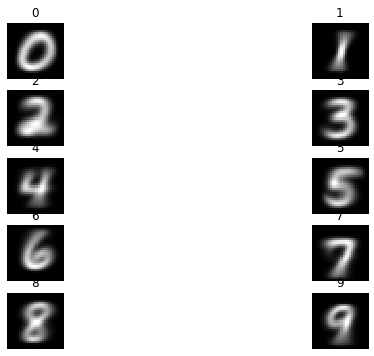

In [8]:
from fastai import *
from fastai.vision import *

import torch
%matplotlib inline
data = Path('/home/jupyter/hkust/math/data/mnist.pkl.gz')
with gzip.open(data,'rb') as f:
    ((x_train,y_train), (x_valid, y_valid), _) = pickle.load(f,encoding='latin-1')
df = pd.DataFrame(data=x_train)
df['label'] = y_train
means = []
for i in range(10):
    means.append(np.array(df[df['label'] == i].mean()[:-1]))
rows = 5
fig, ax = plt.subplots(rows,2,figsize=(10,6))
#fig.subplots_adjust(hspace=0.0, wspace=0, left=0, right=1, top=1, bottom=0)
idx = 0

for i in range(rows):
    img_1 = means[idx].reshape(28,28)
    ax[i][0].set_title(idx)
    ax[i][0].imshow(img_1,cmap='gray')
    ax[i][0].set_axis_off()
    idx += 1
    
    img_2 = means[idx].reshape(28,28)
    ax[i][1].set_title(idx)
    ax[i][1].set_axis_off()
    ax[i][1].imshow(img_2,cmap='gray')
    idx += 1

           Figure 1: Mean of Training Set

##	Experiment setup 

### 	ResNet-18

We are using ImageNet pretrained ResNet-18 model shown in Appendix, final convolution layer is used to extract feature embeddings for MNIST validation set. The model is then added with a specified defined classification head for finetuning. The customized designed included concat-pooling (avg and max pool), two extra linear blocks with Relu**[5]**, BN**[8]** and Dropout**[9]** and cosine annealing is used for fast convergence. During finetuning, the added layer is first trained for 4 epochs and the entire model is trained for 5 epochs. Adam optimizer and discriminative learning rate**[10]** is used.

Features from conv[7],linear[1][3], linear[1][7] and softmax layer is extracted. T-SNE is used to project high dimensional features to 2D for analysis **[Appendix]**. We also plot its original image in thumbnail to further understand feature representation. Finally, a single image is randomly selected and forward passed to the fine-tuned model, each convolutional filter representation is captured and plotted.

### 	Scattering Net

A single 2D scattering net layer is used to extract features from MNIST validation set, the features are then projected to 2D using T-SNE for analysis.

#   Visualization

## ResNet-18

In this section, we first plot T-SNE graph for pretrained ResNet 18 final convolution layer feature extractions from MNIST validation set. After fine-tuning the model, different layers’ feature embeddings are captured from final convolution to output. We have found that when projecting the different layers’ features in 2D, each class have demonstrated a better clustering towards their class mean. In order to further investigate the outliners, we have plotted original thumbnail image to show that most of the outliners are noise in the MNIST, and feature representation learned from CNN models are well separated with a clear margin gap.

Finally, we have tested how each CNN filters are capturing different features. By showing the activation maps in section 4.1.6, we explained that ResNet 18 is overparameterized for MNIST classification task. 

### Final Conv Layer in pretrained ResNet

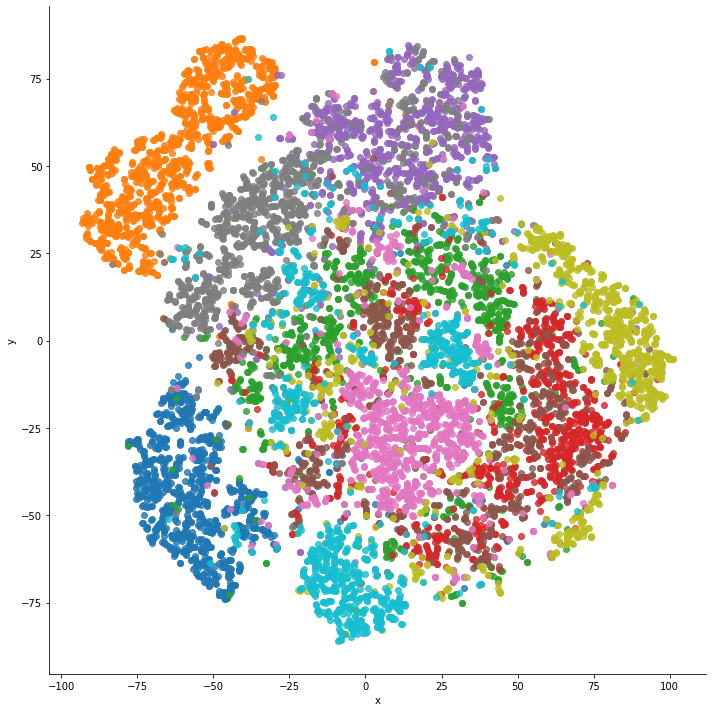

In [19]:
g = sns.lmplot('x', 'y', data=prob_df, hue='labels', fit_reg=False, legend=False, height=10)

                Figure 2: 10K datapoints with its 512 features

### Final Conv Layer after fine-tuning

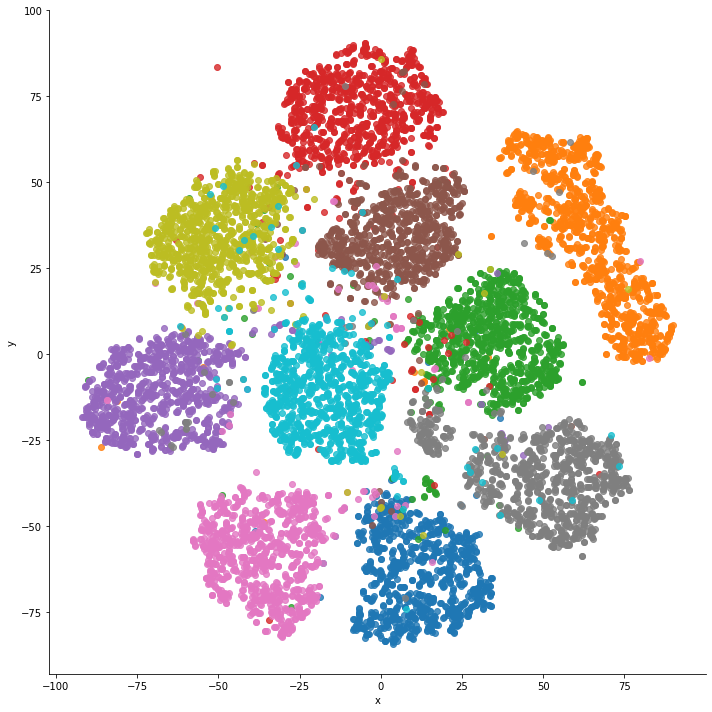

In [89]:
g = sns.lmplot('x', 'y', data=prob_df, hue='labels', fit_reg=False, legend=False, height=10)

                Figure 3: 10K datapoints with its 512 features

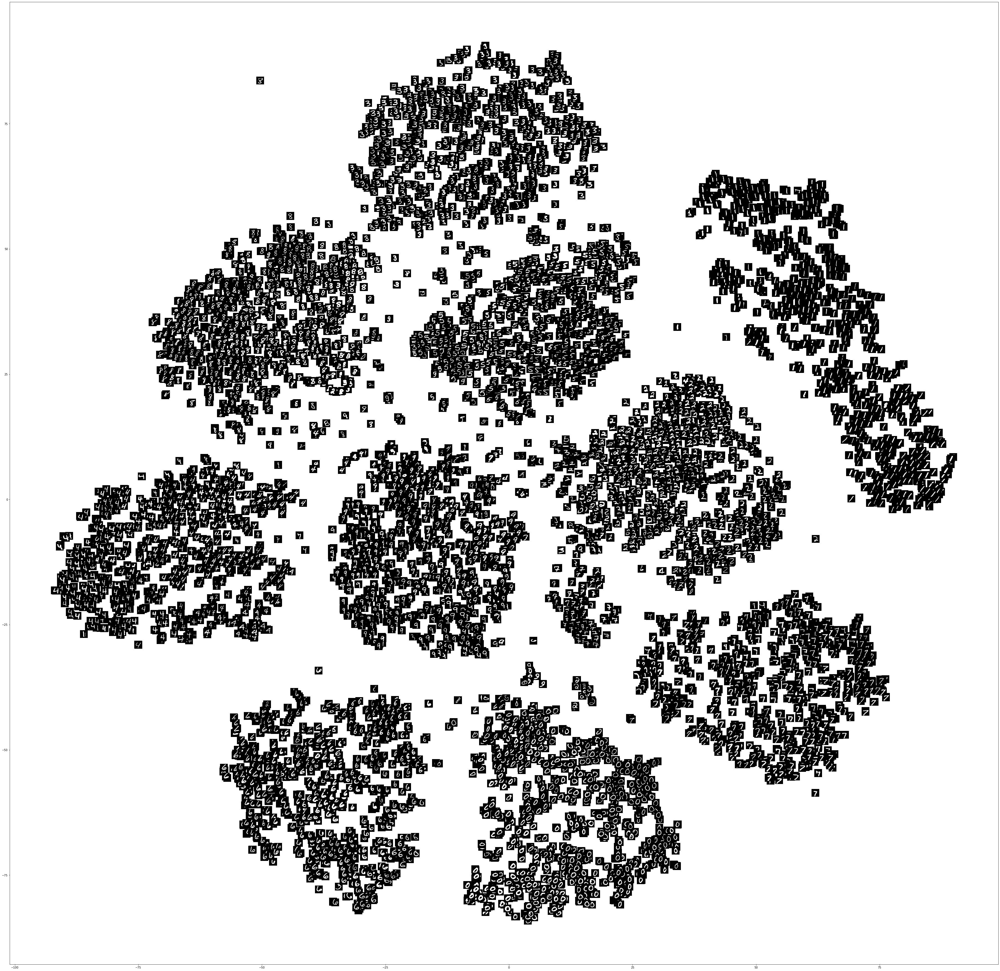

In [91]:
prob_df['fname'] = f_names
fig, ax = visualize_scatter_with_images(conv_tsne, prob_df, image_zoom=1, suffix='conv7')
plt.show()

                Figure 3.1: Thumbnail mapped to its T-SNE presentation

As we can see, the fine-tuned model is able to have a better clustering distribution than the pretrained verison. In addtion, the outliners in the margin areas are out of order distribution or mislabels. It will be much clear as we moving towards to the output layer

### Linear Layer in Classification head

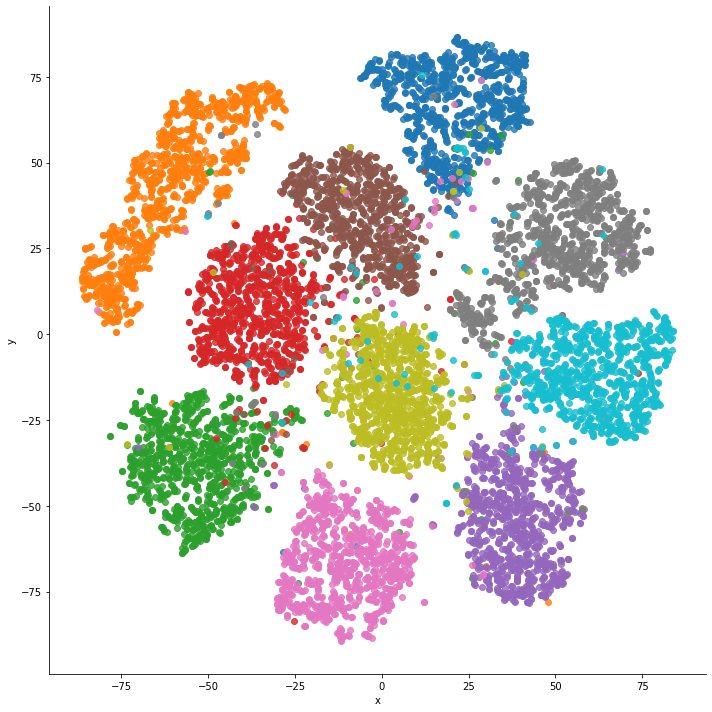

In [96]:
g = sns.lmplot('x', 'y', data=prob_df, hue='labels', fit_reg=False, legend=False, height=10)

                Figure 4: 10K datapoints with its 1024 features

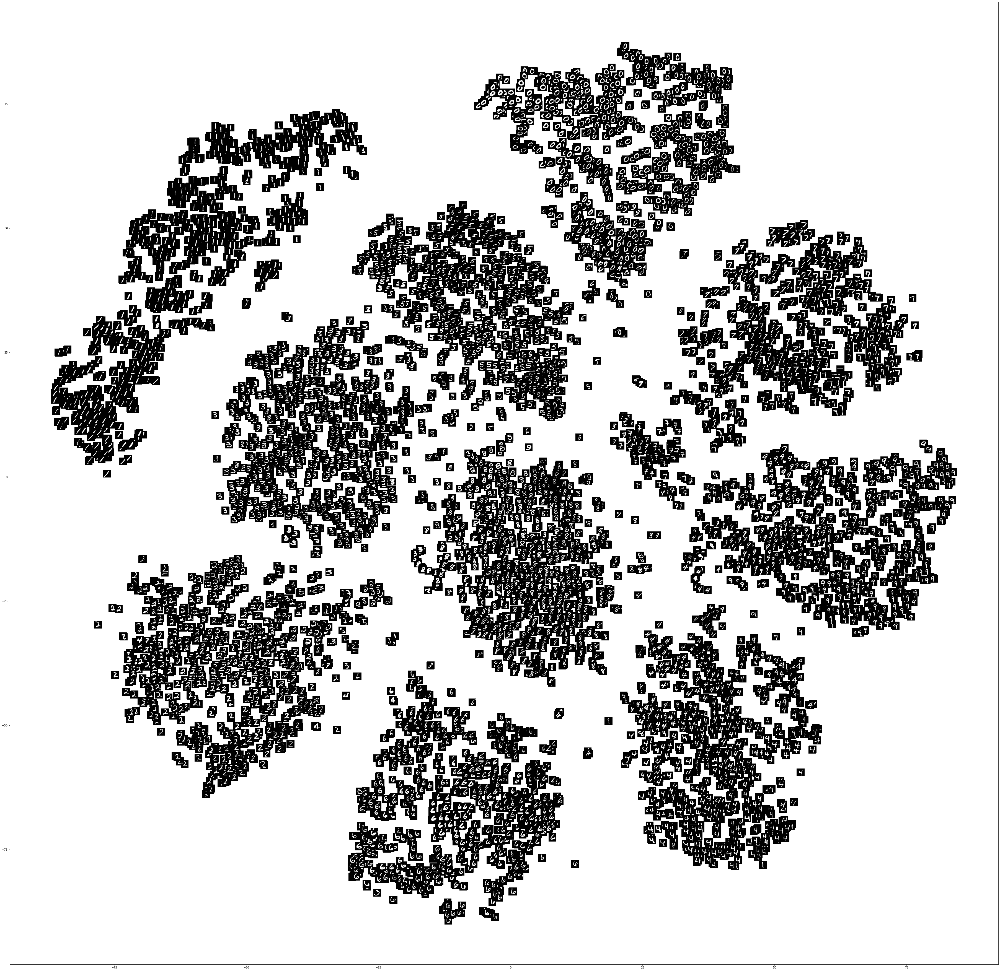

In [98]:
fig, ax = visualize_scatter_with_images(linear_tsne, prob_df, image_zoom=1, suffix='linear_1st_m13')
plt.show()

                Figure 4.1: Thumbnail mapped to its T-SNE presentation

### Second Linear Layer in Classification head

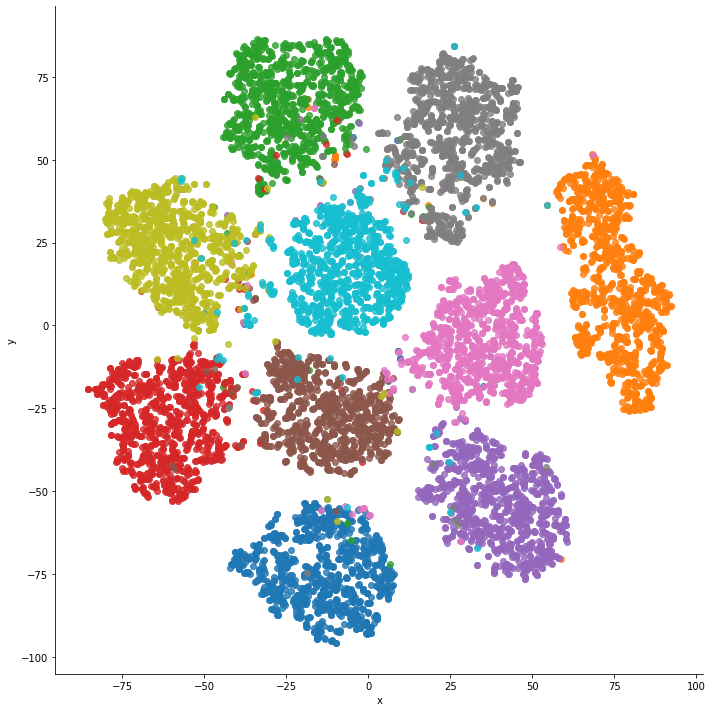

In [101]:
prob_df = pd.DataFrame(np.concatenate((linear_tsne, y_vals[:,None]), axis=1), columns=['x','y','labels'])
g = sns.lmplot('x', 'y', data=prob_df, hue='labels', fit_reg=False, legend=False, height=10)

                Figure 5: 10K datapoints with its 1024 features

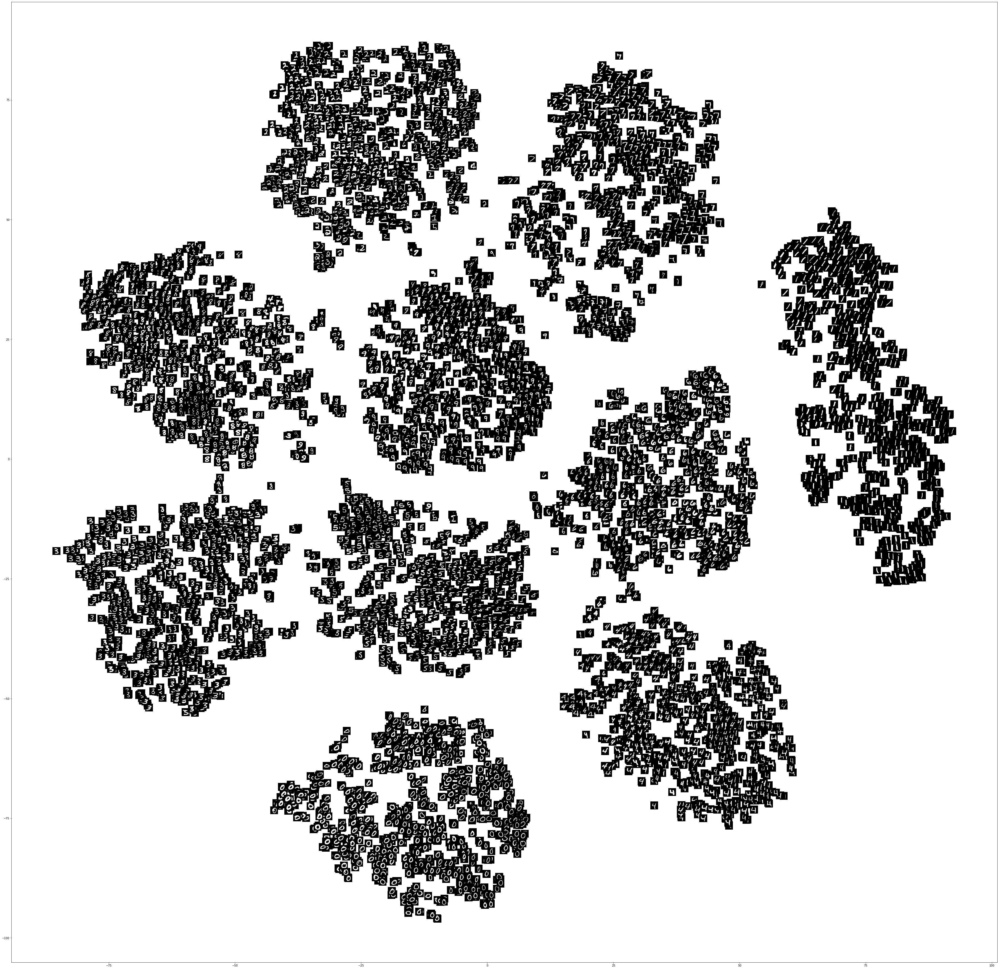

In [102]:
prob_df['fname'] = f_names
fig, ax = visualize_scatter_with_images(linear_tsne, prob_df, image_zoom=1, suffix='linear7')
plt.show()

                Figure 5.1: Thumbnail mapped to its T-SNE presentation

### Final Classification head

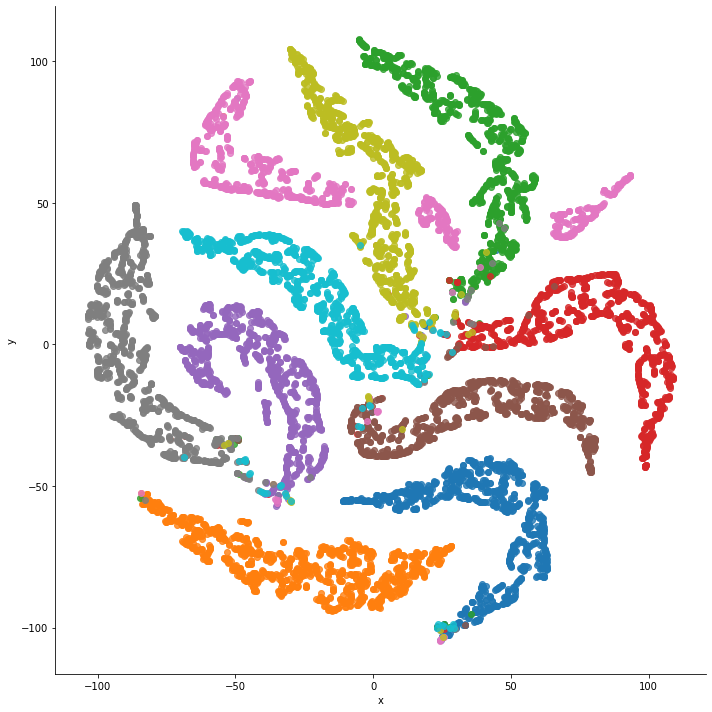

In [28]:
g = sns.lmplot('x', 'y', data=prob_df, hue='labels', fit_reg=False, legend=False, height=10)

                Figure 6: 10K datapoints with its 10 features

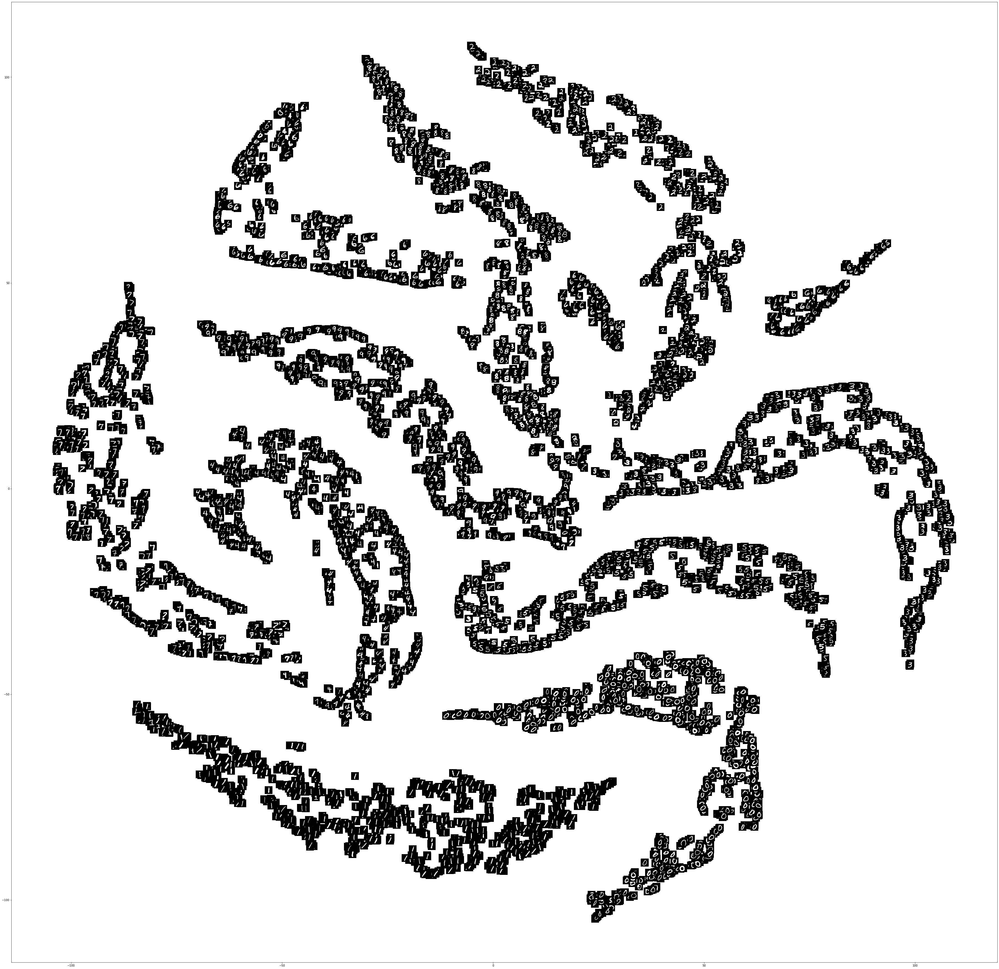

In [43]:
fig, ax = visualize_scatter_with_images(probs_trans, prob_df, image_zoom=1, suffix='probabilities')
plt.show()

                Figure 6.1: Thumbnail mapped to its T-SNE presentation

In the final classification head, it is clear that it has poor clustering representation. Softmax layer has calculated activations from high dimentions to 10 dimensions, therefore the feature representations lose much of its information, resulting T-SNE has poor projection.

### Activation Map for single input

ResNet 18 has 7 convolutional layers, its filter size is the following: 64, 64, 64, 64, 64, 128, 256, 512. For layers that have more than 64 filters, the first 64 filters are plotted. 
Figure 7 shows the 1st convolution layer 64 filters


In [130]:
[i.features.shape for i in sfs]

[torch.Size([1, 64, 14, 14]),
 torch.Size([1, 64, 14, 14]),
 torch.Size([1, 64, 14, 14]),
 torch.Size([1, 64, 7, 7]),
 torch.Size([1, 64, 7, 7]),
 torch.Size([1, 128, 4, 4]),
 torch.Size([1, 256, 2, 2]),
 torch.Size([1, 512, 1, 1])]

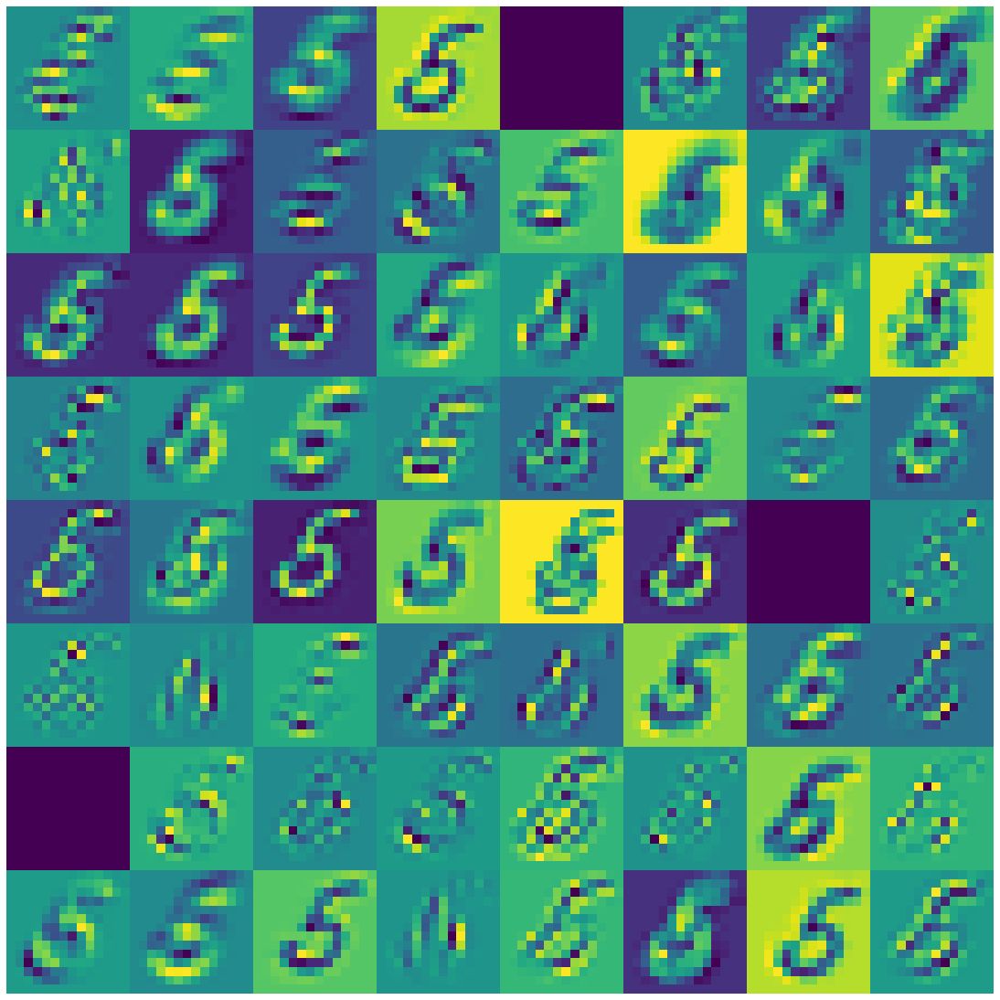

In [131]:
activs = sfs[0].features.detach().cpu().numpy()[0]
fig, axes = plt.subplots(8,8, figsize=(15,15))
fig.subplots_adjust(hspace=0.0, wspace=0, left=0, right=1, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
    ax.imshow(activs[i])
    ax.set_axis_off()

                Figure 7: 1st convolution layer 64 filters

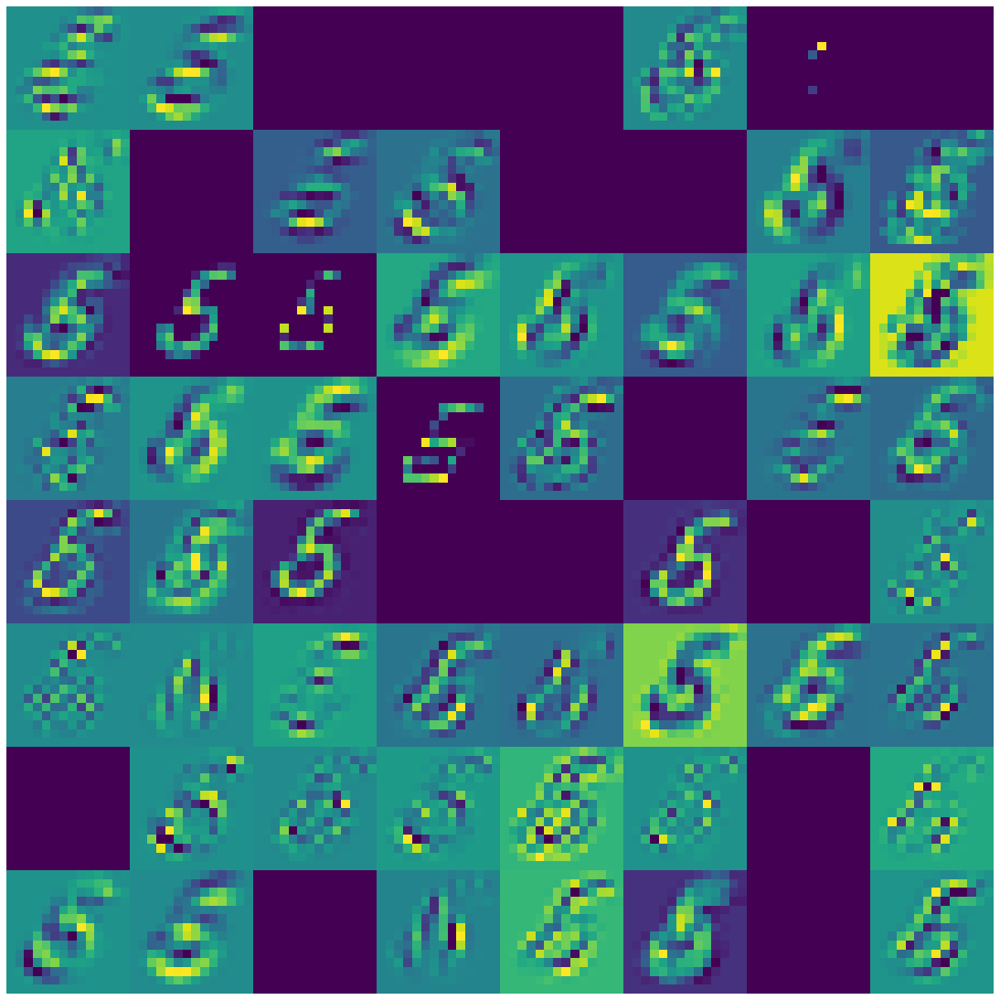

In [132]:
activs = sfs[1].features.detach().cpu().numpy()[0]
fig, axes = plt.subplots(8,8, figsize=(15,15))
fig.subplots_adjust(hspace=0.0, wspace=0, left=0, right=1, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
    ax.imshow(activs[i])
    ax.set_axis_off()

                Figure 8: 2nd convolution layer 64 filters

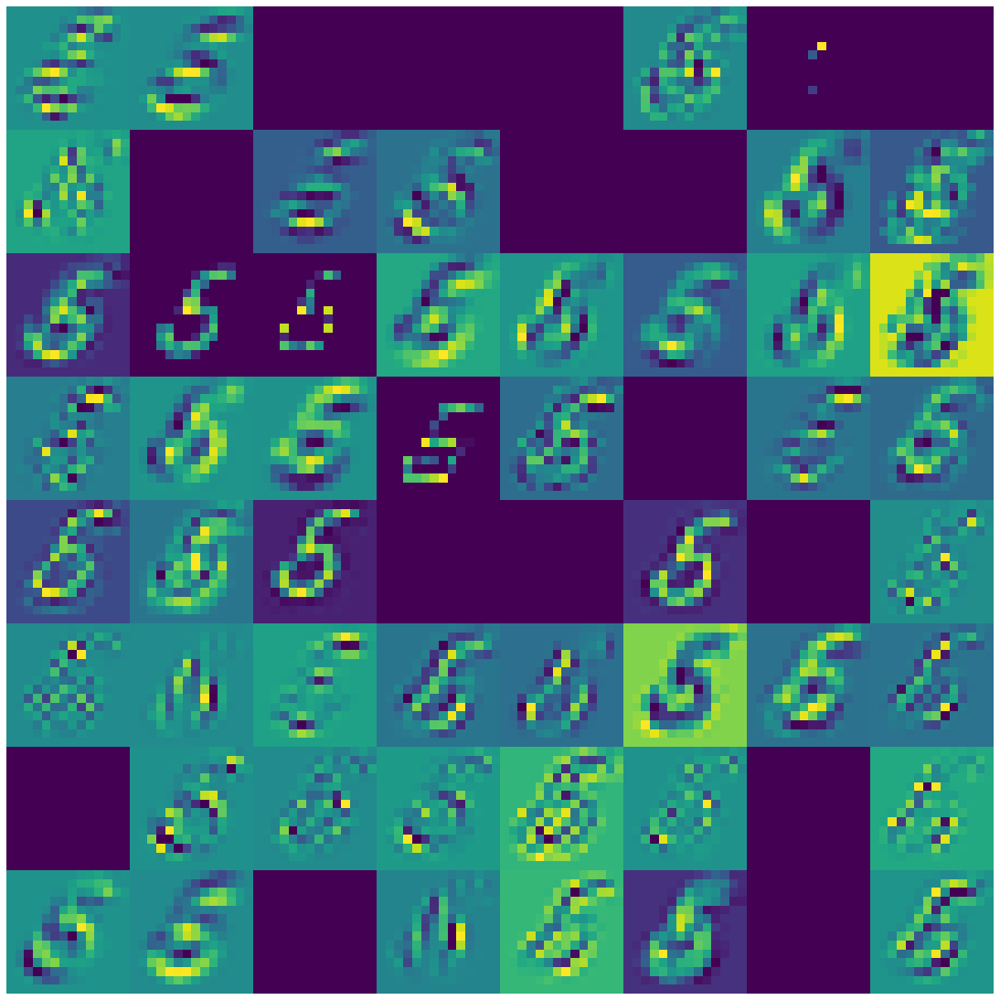

In [133]:
activs = sfs[2].features.detach().cpu().numpy()[0]
fig, axes = plt.subplots(8,8, figsize=(15,15))
fig.subplots_adjust(hspace=0.0, wspace=0, left=0, right=1, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
    ax.imshow(activs[i])
    ax.set_axis_off()

                Figure 9: 3rd convolution layer 64 filters

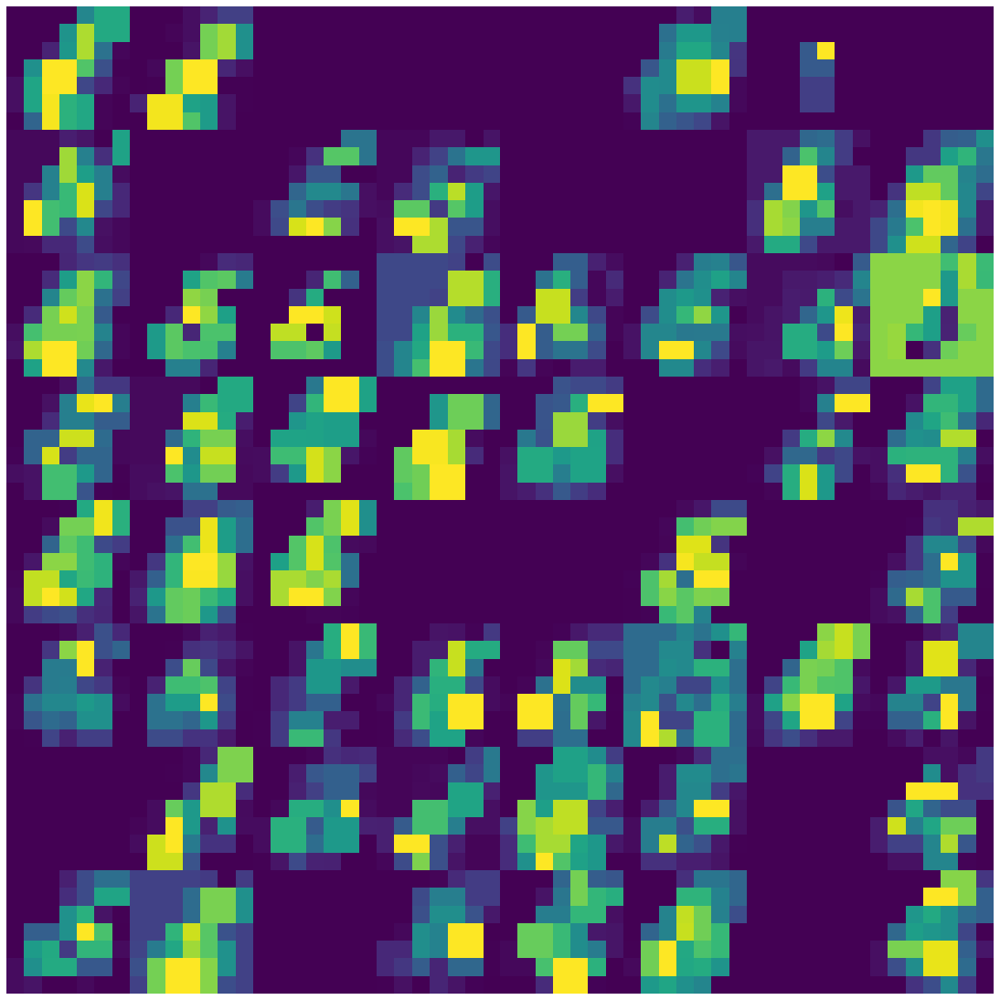

In [134]:
activs = sfs[3].features.detach().cpu().numpy()[0]
fig, axes = plt.subplots(8,8, figsize=(15,15))
fig.subplots_adjust(hspace=0.0, wspace=0, left=0, right=1, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
    ax.imshow(activs[i])
    ax.set_axis_off()

                Figure 10: 4th convolution layer 64 filters

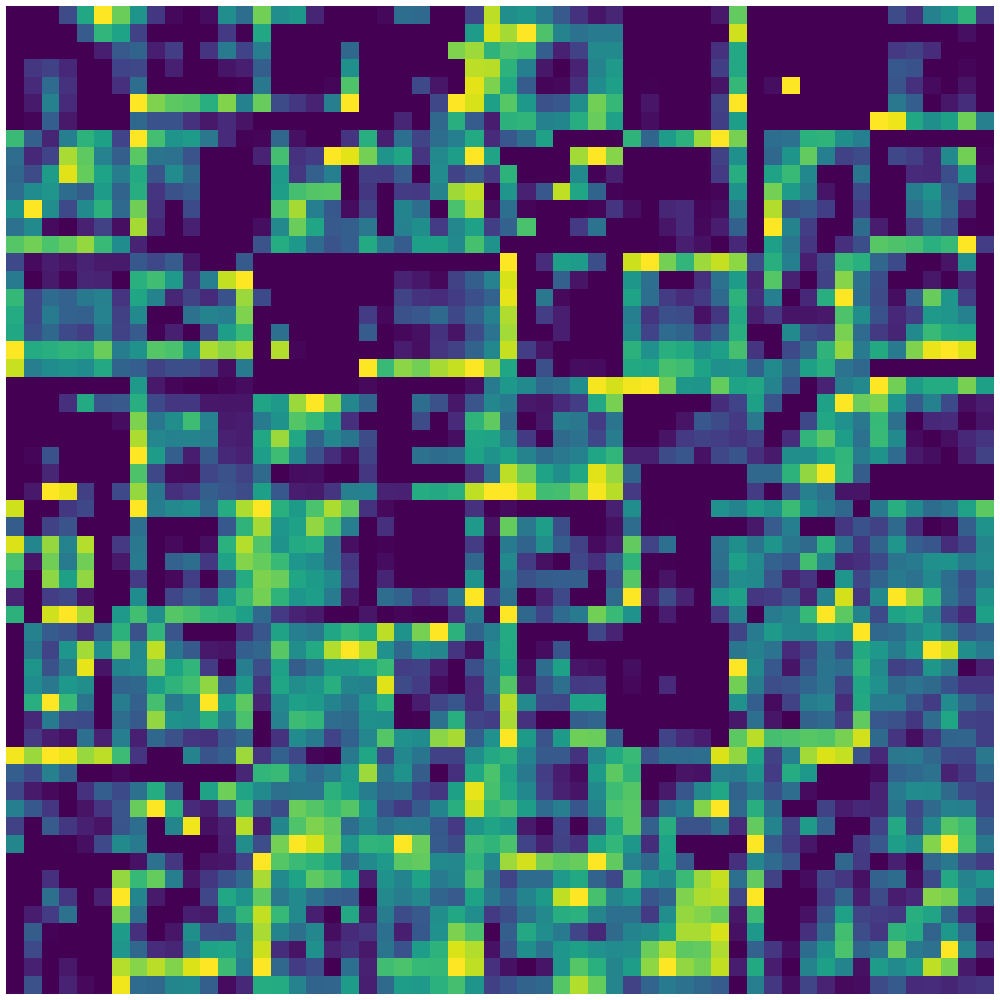

In [135]:
activs = sfs[4].features.detach().cpu().numpy()[0]
fig, axes = plt.subplots(8,8, figsize=(15,15))
fig.subplots_adjust(hspace=0.0, wspace=0, left=0, right=1, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
    ax.imshow(activs[i])
    ax.set_axis_off()

                Figure 11: 5th convolution layer 64 filters

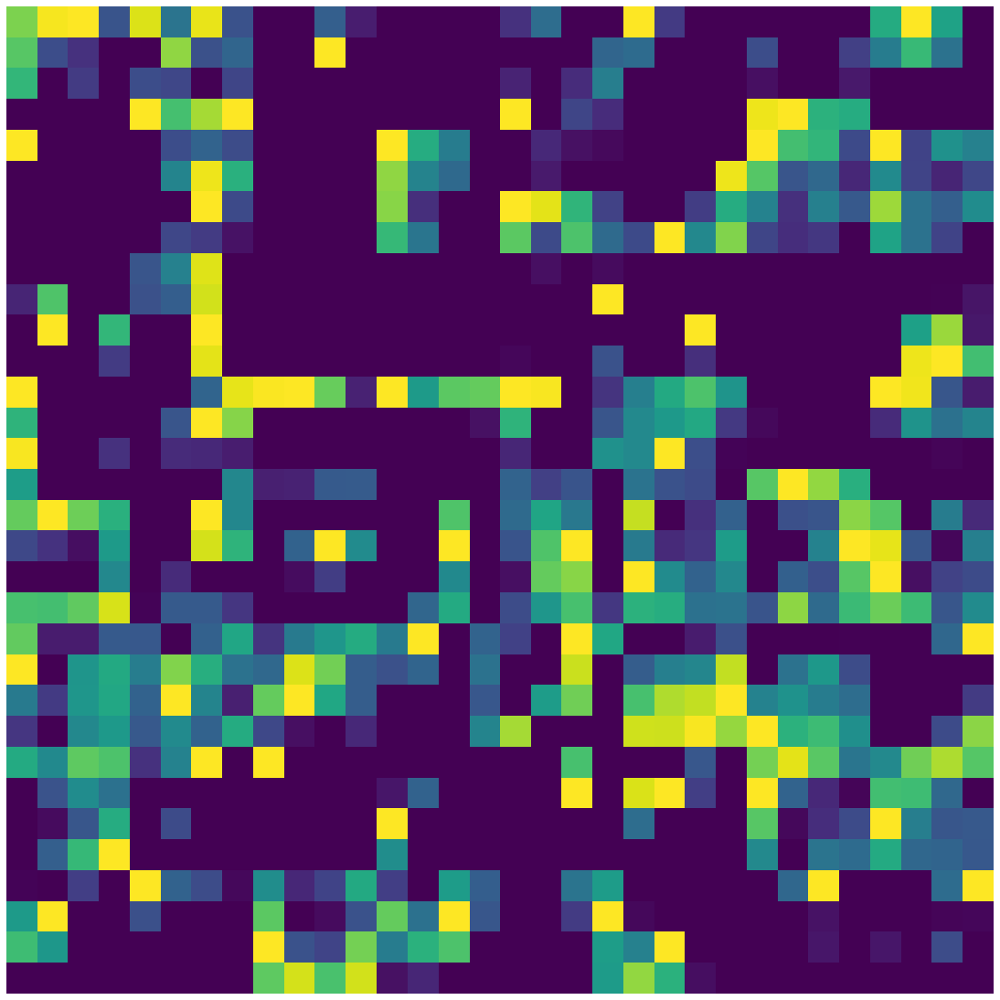

In [136]:
activs = sfs[5].features.detach().cpu().numpy()[0]
fig, axes = plt.subplots(8,8, figsize=(15,15))
fig.subplots_adjust(hspace=0.0, wspace=0, left=0, right=1, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
    ax.imshow(activs[i])
    ax.set_axis_off()


                Figure 12: 6th convolution layer with first 64 filters

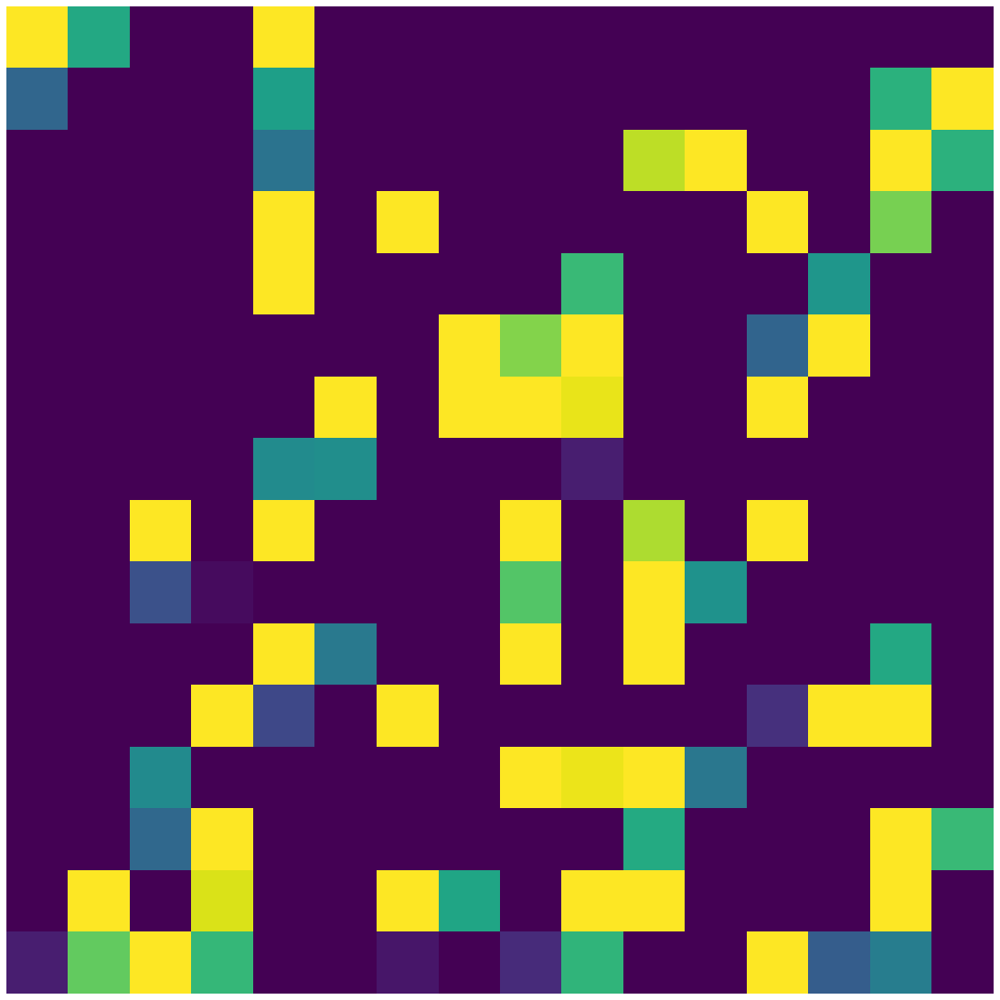

In [137]:
activs = sfs[6].features.detach().cpu().numpy()[0]
fig, axes = plt.subplots(8,8, figsize=(15,15))
fig.subplots_adjust(hspace=0.0, wspace=0, left=0, right=1, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
    ax.imshow(activs[i])
    ax.set_axis_off()

                Figure 13: 7th convolution layer with first 64 filters

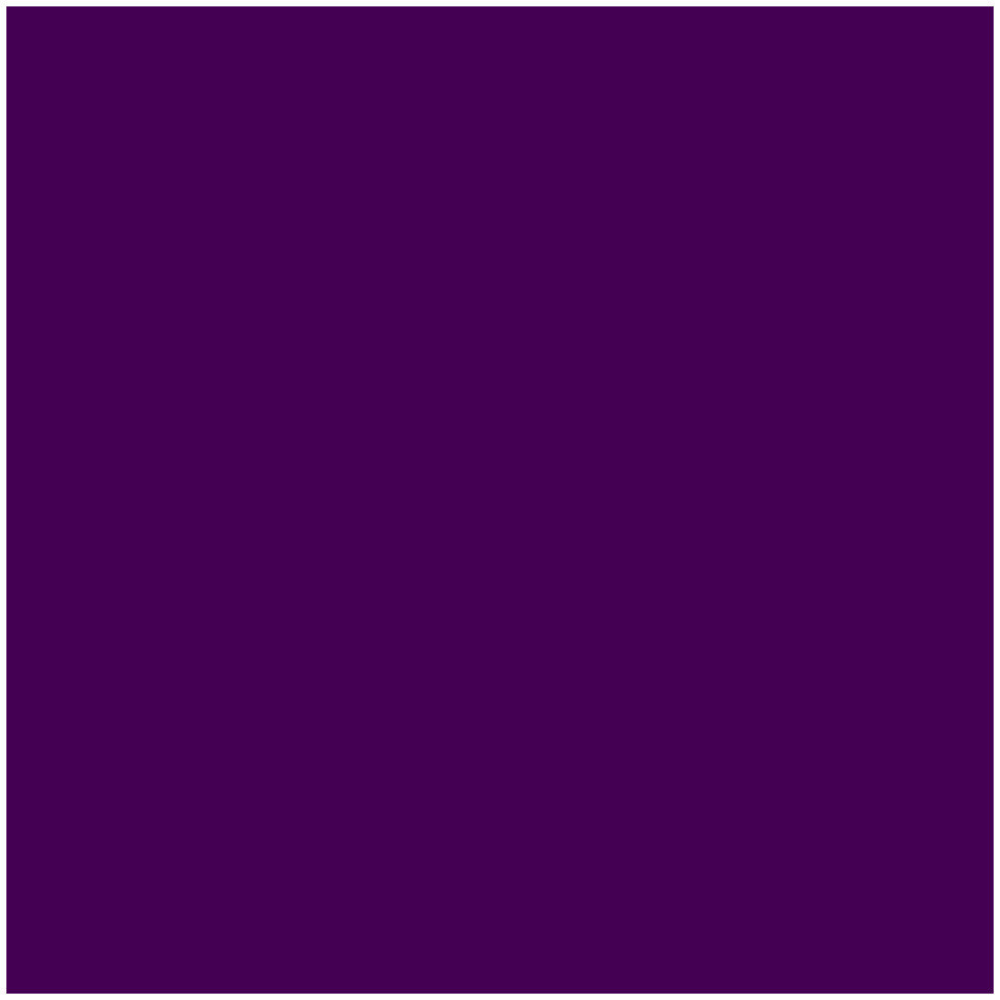

In [147]:
activs = sfs[7].features.detach().cpu().numpy()[0]
fig, axes = plt.subplots(8,8, figsize=(15,15))
fig.subplots_adjust(hspace=0.0, wspace=0, left=0, right=1, top=1, bottom=0)
for i, ax in enumerate(axes.flat):
    ax.imshow(activs[i])
    ax.set_axis_off()

                Figure 14: 8th convolution layer with first 64 filters

As we can see from the above plots, the digit 5 has distilled in the later convolution layers. We argue that the reason for such effect is because MNIST doesn't have rich information presented in its features, and high level convolution filters are designed to capture high level feature representations. Thus, no related information are detected in the high level filters, its plot is therefore blank.

## 	Scattering Net feature representation

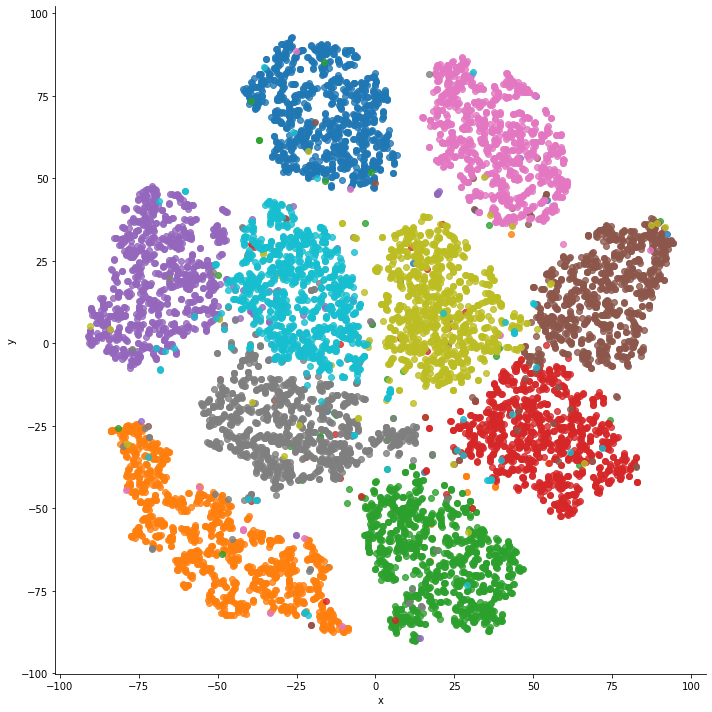

In [31]:
g = sns.lmplot('x', 'y', data=prob_df, hue='labels', fit_reg=False, legend=False, height=10)

                Figure 15: 10K datapoints with its 3096 features

The single layer scattering net has produced impressive clustering feature embeddings. The pre-designed filters are working well on extracting lower level features. 

# Evaluation

In this section, we first report accuracy of different machine learning models, such as ResNet18, Regression and Random Forest against baseline non machine learning model. We have shown that CNN models are performing best in different metrics. We then calculated its various status based on the project-1 requirements.

##  Neural Collapse Proof

According to the ***Prevalence of Neural Collapse during the terminal phase of deep learning training*** by Vardan P et al., when training phase entered the Terminal Phase of Training(TPT), the training error stays effectively zero while training loss stays nearly zero.

In TPT, the process **Neural Collapse** can be characterized by four manifestations in the classifier and last-layer activations, including Variability collapse(NC1), Convergence to Simplex ETF(NC2), Convergence to self-duality(NC3) and Simplification to Nearest Class-Center(NC4). In this section, we will prove (i) the contraction of within class variation closeness to equal-norms of class-means and (ii) equal-angularity closeness to maximal-angle equiangularity.

### Prev settings

In this work, we use the resnet18 as our pretrained models to extract features. The dataset we used is MNIST and we sub-sampled N=5000 examples per class for MNIST. To approach the TPT status, as mentioned in the previous sections, we fintuned the pretrained models until its training loss converges to 0.60%(the accuracy close to 99.40%).

In Vardan P's original paper, they used the last linear classifer layer as the **last-layer activations** or **last-layer features**. Here, to explore further, we seperately extract resnet18 **final conv layer features(512 dimensions)**, **first linear layer features in classifer head(1024 dimensions)** and **last linear layer features in classifer head(512 dimensions)**. Then accordingly calculate related statistical properties as required.

### Calculate features' statistical properties

During training, we pass the train datasets(label balanced) through the fine-tuned pretrained model and use Pytorch forward hooks to extract features we need. Then based on the collected features we calculate the following statistics.

The note $\Phi_{i,c}$ means the $i$th example's features in $c$th class, and $\Phi_{i,c} \in R^{p}$, $p$ is the dimensions of features.<br>
First, we compute the train class means $$\mu_c \triangleq {\underset {i}{\operatorname {Ave}}} \{\Phi_{i,c}\}, \ c=1,...,C$$ for example, if we set the last linear layer features as the targets, the $\mu_c$'s shape is (10,512)

Then we compute the global mean of features over all samples $$\mu_G \triangleq {\underset {i,c}{\operatorname {Ave}}} \{\Phi_{i,c} \}, \ i=1,...,5000; \ c=1,...,C$$ the shape of $\mu_G$ is (512,) if we choose the last linear layer features as targets

For total covariance matrix, to remove bias, we subtracted global means from each sample's features: $\{\Phi_{i,c}-\mu_G\}$, then get the total covariance $\Sigma_T \in R^{p\times p}$: $$\Sigma_T \triangleq {\underset {i,c}{\operatorname {Ave}}} \{(\Phi_{i,c}-\mu_G)(\Phi_{i,c}-\mu_G)^T\}$$ the shape of $\Sigma_T$ is (512,512) if we choose the last linear layer features as targets

Similarly, the between-class covariance, $\Sigma_B \in R^{p\times p}$: $$\Sigma_B \triangleq {\underset {c}{\operatorname {Ave}}} \{(\mu_{c}-\mu_G)(\mu_{c}-\mu_G)^T\}$$
and the within-class covariance, $\Sigma_W \in R^{p\times p}$: $$\Sigma_W \triangleq {\underset {i,c}{\operatorname {Ave}}} \{(\Phi_{i,c}-\mu_c)(\Phi_{i,c}-\mu_c)^T\}$$

### Results

Based on the statistics we calculated above, we try to verify two characteristics: (i) the *contraction of within class variation* closeness to *equal-norms of class-means* and (ii) *equal-angularity* closeness to *maximal-angle equiangularity*. Here, we defined the mathematical expressions of these four terms:
-   Contraction of within class variation: $$Tr\{\Sigma_W \Sigma_B^{\dagger}\}/C$$
-   Equal-norms of class-means: $$Std_c(||\mu_c-\mu_G||_2)/Avg_c(||\mu_c-\mu_G||_2)$$ 
-   Equal-angularity: $$Std_c(cos_u(c,c^{'})） = Std_c[<\mu_c-\mu_G,\mu_{c^{'}}-\mu_G / (||\mu_c-\mu_G||_2||\mu_{c^{'}}-\mu_G||_2)]$$
-   Maximal-angle equiangularity: $$Avg_{c,c^{'}}|cos_u(c,c^{'})+1/(C-1)|$$

Calculation results based on different extracted features show as follows:

| Features  |  Contraction of within class variation | Equal-norms of class-means  |
| :---  | :---:  | :---:  |
|Last Conv Layer Feats|0.1889|0.1503|
|First Linear Layer Feats|0.1834|0.1303|
|Last Linear Layer Feats|0.1110|0.0602|

| Features  |  Equal-angularity | Maximal-angle equiangularity  |
| :---  | :---  | :---  |
|Last Conv Layer Feats|0.0230|0.1143|
|First Linear Layer Feats|0.0198|0.1136|
|Last Linear Layer Feats|0.0074|0.1115|

According to the above results, the two closeness hypotheses are proved in a certain extent. Besides, we observed that compared with different layers' extracted features, the latter layers' features gains low within class variation, which means through deeper layer training, features belonging to each catergory gradually collapse onto their calss-means. Similar phenomenan happened in the *Equal-angularity*, which implies that these class-means converge to the vertices of the Simplex ETF.

# Cifar 10

Since MNIST is single channel and doesn’t contain rich information, we therefore rerun the test on Cifar10 dataset. The final convolution layer features and activation maps are plotted. We noticed a degradation of performance of scattering net, where CNN are still robust and able to capture more features.

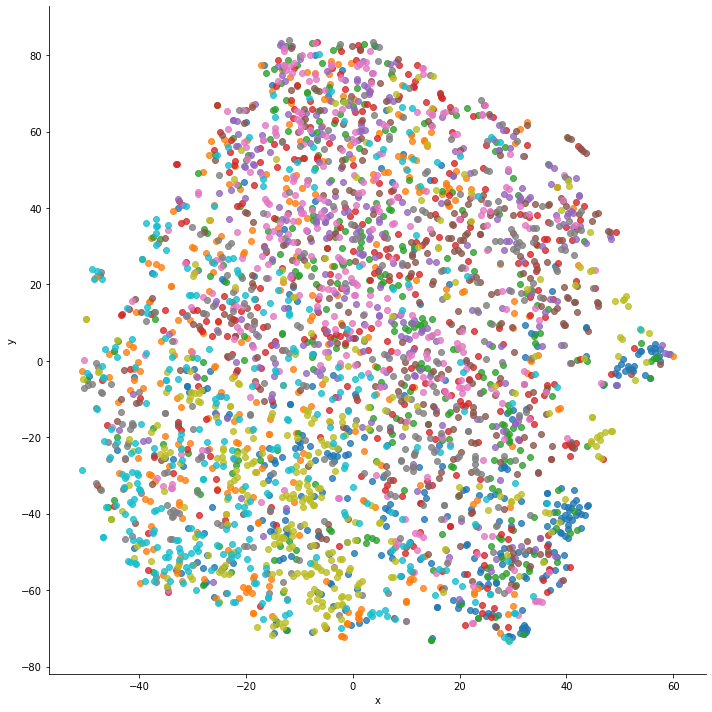

In [47]:
g = sns.lmplot('x', 'y', data=prob_df, hue='labels', fit_reg=False, legend=False, height=10)

                Figure 16: Scattering net, 3200 datapoints with its 3096 features

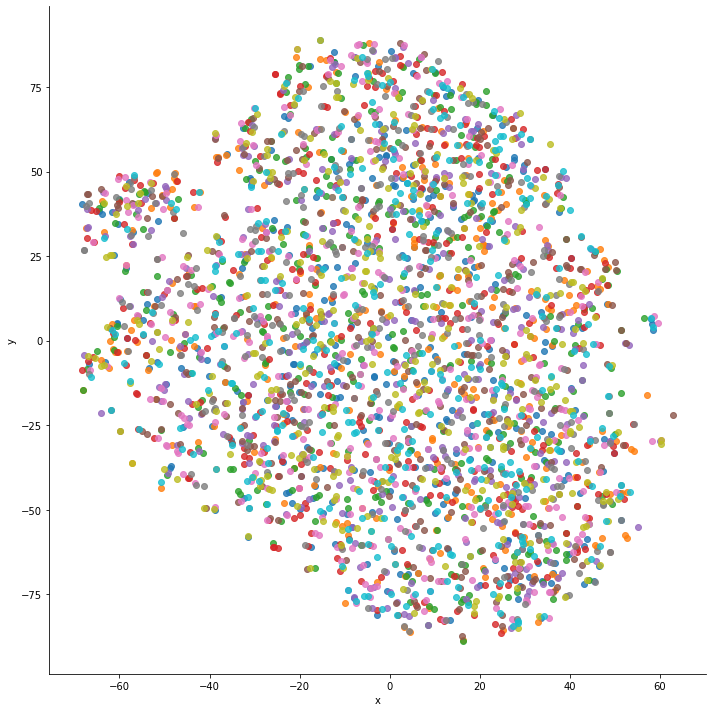

In [65]:
g = sns.lmplot('x', 'y', data=prob_df, hue='labels', fit_reg=False, legend=False, height=10)

                 Figure 17: ResNet-18, 3200 datapoints with its 512 features

Both Scattering Net and Pretrained ResNet-18 is unable to seperate the data at this stage since CIFAR-10 dataset contains more information than MNIST dataset

# Conclusion

# Citation

[1] A. Krizhevshy et.al, 2016, Image Net Classification with Deep Convolutional Neural Networks https://papers.nips.cc/paper/4824-imagenet-classification-with-deep-convolutional-neural-networks.pdf

[2] K. Simonyan & A. Zisserman, 2015, Very Deep Convolutional Networks for Large-Scale Image Recognition
https://arxiv.org/abs/1409.1556

[3] K. He et.al, 2015, Deep Residual Learning for Image Recognition
https://arxiv.org/abs/1512.03385

[4] M. Tan et.al, 2019, EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks
https://arxiv.org/abs/1905.11946

[5] K. He et.al, 2015, Delving Deep into Rectifiers: Surpassing Human-level Performance on ImageNet Classification
https://arxiv.org/abs/1502.01852

[6] M.D. Zeiler & R. Fergus, 2013, Visualizing and Understanding Convolutional Networks
https://arxiv.org/pdf/1311.2901.pdf

[7] V. Papyan et.al, 2020, Prevalence of Neural Collapse during the terminal phase of deep learning training
https://arxiv.org/abs/2008.08186

[8] S. Ioffe & C. Szegedy, 2015, Batch Normalization: Accelerating Deep Network Training By Reducing Internal Covariate Shift
https://arxiv.org/abs/1502.03167

[9] N. Srivastava et.al, 2014, Dropout: a simple way to prevent neural networks from overfitting
https://dl.acm.org/doi/10.5555/2627435.2670313

[10] J. Howard & S. Ruder, 2018, Universal Language Model Fine-tuning for Text Classification
https://arxiv.org/abs/1801.06146


# Code Reference

In [6]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [7]:
from fastai import *
from fastai.vision import *

In [8]:
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn import manifold, datasets
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.metrics import confusion_matrix
from scipy.spatial.distance import squareform
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.ticker import NullFormatter
import PIL

from kymatio.torch import Scattering2D

In [9]:
path = untar_data(URLs.MNIST,dest='/home/jupyter/hkust/math/data')
path.ls()

[PosixPath('/home/jupyter/hkust/math/data/mnist_png/testing'),
 PosixPath('/home/jupyter/hkust/math/data/mnist_png/training'),
 PosixPath('/home/jupyter/hkust/math/data/mnist_png/models')]

**Getting Scattering Net features**

In [20]:
scattering = Scattering2D(shape = (28, 28), J=2)
data = (ImageList.from_folder(path=path,convert_mode='L')
                .split_by_folder(train='training',valid='testing')
                .label_from_folder()
                .databunch(bs=128))

In [25]:
sfs = []
targ = []
for x,y in data.valid_dl:
    p = scattering(x)
    sfs.append(p.detach().numpy())
    targ.append(y)

In [26]:
sfs_cat = np.concatenate(sfs)
sfs_cat.shape

(10000, 1, 81, 7, 7)

In [27]:
sfs_cat = sfs_cat.reshape(10000,-1)
sfs_cat.shape

(10000, 3969)

In [28]:
probs_trans = manifold.TSNE(n_components=2, perplexity=15).fit_transform(sfs_cat)

In [29]:
y = np.concatenate(targ)
y.shape

(10000,)

In [30]:
prob_df = pd.DataFrame(np.concatenate((probs_trans, y[:,None]), axis=1), columns=['x','y','labels'])

**Getting ResNet-18 Features**

In [10]:
data = ImageDataBunch.from_folder(path=path,train='training',valid='testing',bs=128).normalize(imagenet_stats)

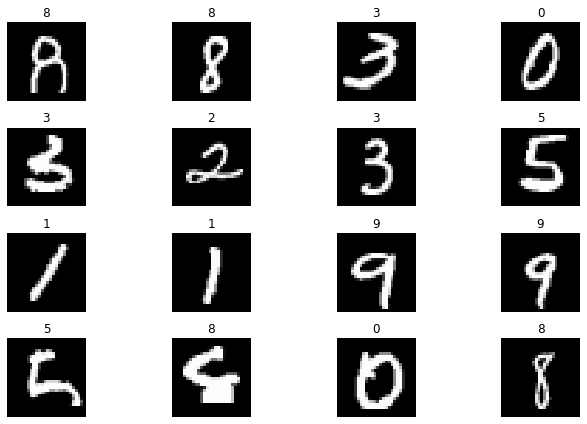

In [6]:
data.show_batch(rows=4,figsize=(10,6))

In [7]:
data.train_ds[0]

(Image (3, 28, 28), Category 1)

In [8]:
data.train_ds[0][0]

In [9]:
data.train_ds

LabelList (60000 items)
x: ImageList
Image (3, 28, 28),Image (3, 28, 28),Image (3, 28, 28),Image (3, 28, 28),Image (3, 28, 28)
y: CategoryList
1,1,1,1,1
Path: /home/jupyter/hkust/math/data/mnist_png

In [6]:
learn = cnn_learner(data,models.resnet18,metrics=error_rate).to_fp16()

**Customized head and model index labels**

In [11]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

In [12]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.740019,0.483432,0.156500,04:06
1,0.354149,0.214774,0.067900,00:33
2,0.219526,0.148823,0.047400,00:33
3,0.172455,0.134206,0.043000,00:33


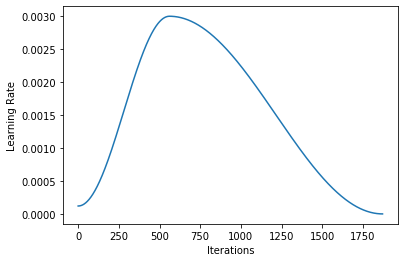

In [13]:
learn.recorder.plot_lr()

                Figure: Cosine Scheduler

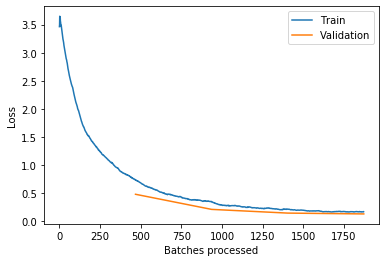

In [14]:
learn.recorder.plot_losses()

                Figure: 1st stage training

In [15]:
learn.unfreeze()
learn.fit_one_cycle(5, max_lr=slice(1e-6,1e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.141263,0.114553,0.036600,00:36
1,0.106294,0.084589,0.027800,00:36
2,0.075915,0.071318,0.023100,00:36
3,0.068376,0.067394,0.020800,00:36
4,0.057121,0.065715,0.020500,00:36


In [17]:
learn.save('/home/jupyter/hkust/math/model/mnist_res18')

In [8]:
learn.load('/home/jupyter/hkust/math/model/mnist_res18');

In [7]:
interp = ClassificationInterpretation.from_learner(learn)

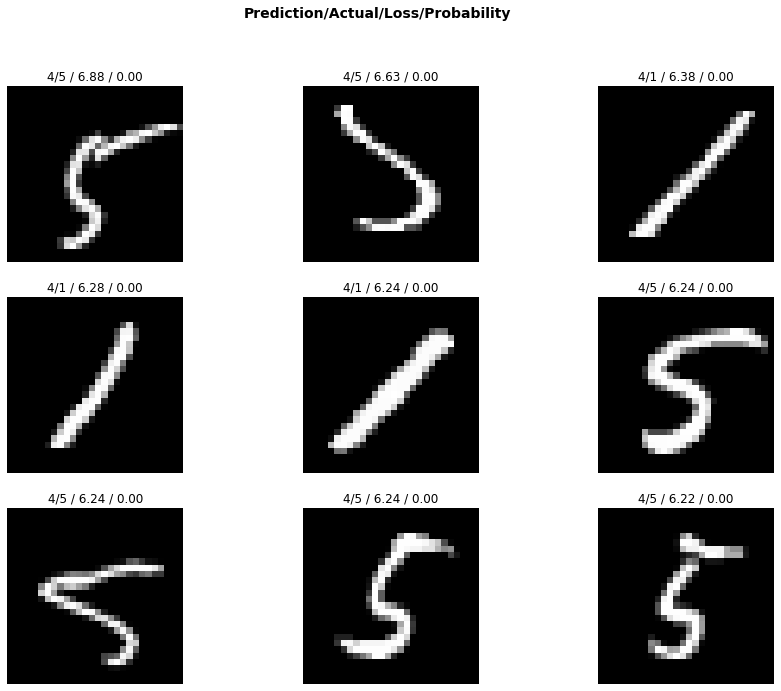

In [8]:
interp.plot_top_losses(9, figsize=(15,11))

In [9]:
preds = interp.preds
y = interp.y_true

In [12]:
preds.shape

torch.Size([10000, 10])

# Getting embeddings 

In [14]:
out_df = pd.DataFrame(preds.numpy())

In [19]:
out_df['label'] = y.numpy()

In [23]:
out_df.to_csv('/home/jupyter/hkust/math/data/final_pred.csv',index=False)

# Result from prediction

In [24]:
probs_trans = manifold.TSNE(n_components=2, perplexity=15).fit_transform(preds)

In [26]:
prob_df = pd.DataFrame(np.concatenate((probs_trans, y[:,None]), axis=1), columns=['x','y','labels'])

In [27]:
prob_df.head()

,x,y,labels
0,17.869276,-80.282677,1.0
1,-83.587456,-54.389988,1.0
2,-11.553489,-74.869148,1.0
3,-3.845061,-81.423561,1.0
4,2.773640,-90.228981,1.0


In [39]:
prob_df['fname'] = learn.data.valid_ds.x.items

In [42]:
def visualize_scatter_with_images(scaled_data, df, figsize=(64,64), image_zoom=1, suffix=1):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    xx = scaled_data[:,0]
    yy = scaled_data[:,1]
    
    for i, (x,y) in enumerate(zip(xx,yy)):
        im = PIL.Image.open(df['fname'][i])
        im.thumbnail((64,64))
        img = OffsetImage(im, zoom=image_zoom, cmap='gray')
        ab = AnnotationBbox(img, (x, y), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([xx,yy]))
    ax.autoscale()
    
    fig.savefig(f'TSNE_{suffix}.jpg', bbox_inches = 'tight')
    return fig, ax

# Taking activation in the middle layers

In [49]:
class SaveFeatures_test():
    features=None
    def __init__(self, m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output.detach()
    def remove(self): self.hook.remove()

In [11]:
y_vals = learn.data.valid_ds.y.items
f_names = learn.data.valid_ds.x.items

In [50]:
def get_activs(l1, l2):
    sfs_lst = []
    m = learn.model.eval()
    sf = SaveFeatures_test(children(m)[l1][l2])
    
    for x,y in learn.data.valid_dl:
        p = m(x)
        sfs_lst.append(to_np(sf.features.cpu().detach()))
        sf.remove
    
    return sfs_lst

# Final convolution activations from Res-18

In [13]:
sfs = get_activs(0, 7) # final convolution layer activation

In [14]:
sfs_cat = np.concatenate(sfs)
sfs_cat.shape

(10000, 512, 1, 1)

In [15]:
sfs_cat = sfs_cat.reshape((10000, -1))
sfs_cat.shape

(10000, 512)

In [16]:
out_df = pd.DataFrame(sfs_cat)
out_df['label'] = y_vals
out_df.to_csv('/home/jupyter/hkust/math/data/conv7_pretrained.csv',index=False)

In [17]:
conv_tsne = manifold.TSNE(n_components=2, perplexity=15).fit_transform(sfs_cat)

In [18]:
prob_df = pd.DataFrame(np.concatenate((conv_tsne, y_vals[:,None]), axis=1), columns=['x','y','labels'])

# First linear layers in head
should I pull before drop out? currently pulling drop out activations

In [36]:
sfs = get_activs(1, 3)

In [37]:
sfs_cat = np.concatenate(sfs)
sfs_cat.shape

(10000, 1024)

In [38]:
out_df = pd.DataFrame(sfs_cat)
out_df['label'] = y_vals
out_df.to_csv('/home/jupyter/hkust/math/data/linear1.csv',index=False)

In [95]:
%%time
linear_tsne = manifold.TSNE(n_components=2, perplexity=15).fit_transform(sfs_cat)

CPU times: user 5min 4s, sys: 0 ns, total: 5min 4s
Wall time: 5min 4s


In [ ]:
prob_df = pd.DataFrame(np.concatenate((linear_tsne, y_vals[:,None]), axis=1), columns=['x','y','labels'])

In [97]:
prob_df['fname'] = f_names

# 2nd Linear layer

In [40]:
sfs = get_activs(1, 7)
sfs_cat = np.concatenate(sfs)
sfs_cat.shape

(10000, 512)

In [41]:
out_df = pd.DataFrame(sfs_cat)
out_df['label'] = y_vals
out_df.to_csv('/home/jupyter/hkust/math/data/linear7.csv',index=False)

In [100]:
%%time
linear_tsne = manifold.TSNE(n_components=2, perplexity=15).fit_transform(sfs_cat)

CPU times: user 2min 45s, sys: 0 ns, total: 2min 45s
Wall time: 2min 45s


# Activations in each conv

In [110]:
PIL.Image.open(learn.data.valid_ds.x.items[4421])

In [125]:
learn.to_fp32();

In [126]:
m = learn.model.eval()

In [127]:
sfs = [SaveFeatures_test(children(m)[0][i]) for i in range(len(children(m)[0]))]

In [128]:
x = learn.data.valid_ds.x[4421]
y = learn.data.valid_ds.y[4421]

In [120]:
x.data[...][None].shape

torch.Size([1, 3, 28, 28])

In [129]:
p = m(x.data[...][None].cuda())

# Cifar 10

In [32]:
path = untar_data(URLs.CIFAR,dest='/home/jupyter/hkust/math/data')
path.ls()

[PosixPath('/home/jupyter/hkust/math/data/cifar10/labels.txt'),
 PosixPath('/home/jupyter/hkust/math/data/cifar10/test'),
 PosixPath('/home/jupyter/hkust/math/data/cifar10/train')]

In [35]:
ImageList.filter_by_folder??

In [36]:
data = (ImageList.from_folder(path=path)
                .filter_by_folder(exclude='mnist_png')
                .split_by_folder(train='train',valid='test')
                .label_from_folder()
                .databunch(bs=128))

In [38]:
data

ImageDataBunch;

Train: LabelList (50000 items)
x: ImageList
Image (3, 32, 32),Image (3, 32, 32),Image (3, 32, 32),Image (3, 32, 32),Image (3, 32, 32)
y: CategoryList
bird,bird,bird,bird,bird
Path: /home/jupyter/hkust/math/data/cifar10;

Valid: LabelList (10000 items)
x: ImageList
Image (3, 32, 32),Image (3, 32, 32),Image (3, 32, 32),Image (3, 32, 32),Image (3, 32, 32)
y: CategoryList
bird,bird,bird,bird,bird
Path: /home/jupyter/hkust/math/data/cifar10;

Test: None

In [39]:
scattering = Scattering2D(shape = (32, 32), J=2)

In [40]:
test_dl = data.valid_dl.new(shuffle=True)

In [41]:
sfs = []
targ = []
for i,(x,y) in enumerate(test_dl):
    if i == 25: # 3200 datapoints
        break
    p = scattering(x)
    sfs.append(p.detach().numpy())
    targ.append(y)

In [42]:
sfs_cat = np.concatenate(sfs)
sfs_cat.shape

(3200, 3, 81, 8, 8)

In [43]:
sfs_cat = sfs_cat.reshape(3200,-1)
sfs_cat.shape

(3200, 15552)

In [44]:
%%time
probs_trans = manifold.TSNE(n_components=2, perplexity=15).fit_transform(sfs_cat)

CPU times: user 6min 2s, sys: 396 ms, total: 6min 2s
Wall time: 6min 2s


In [62]:
y = np.concatenate(targ)
y.shape

(3200,)

In [46]:
prob_df = pd.DataFrame(np.concatenate((probs_trans, y[:,None]), axis=1), columns=['x','y','labels'])

In [52]:
learn = cnn_learner(data,models.resnet18,metrics=error_rate)

In [54]:
sfs_lst = []
m = learn.model.eval()
sf = SaveFeatures_test(children(m)[0][7])

for i, (x,y) in enumerate(test_dl):
    if i == 25:
        break
    p = m(x)
    sfs_lst.append(to_np(sf.features.cpu().detach()))
    sf.remove

In [55]:
sfs_cat = np.concatenate(sfs_lst)
sfs_cat.shape

(3200, 512, 1, 1)

In [56]:
sfs_cat = sfs_cat.reshape(3200,-1)

In [57]:
%%time
probs_trans = manifold.TSNE(n_components=2, perplexity=15).fit_transform(sfs_cat)

CPU times: user 36.8 s, sys: 0 ns, total: 36.8 s
Wall time: 36.8 s


In [64]:
prob_df = pd.DataFrame(np.concatenate((probs_trans, y[:,None]), axis=1), columns=['x','y','labels'])

# Calculate Statistics

```python
def get_properties(sfs_cat, ground_truth, num_sample_each=500, num_labels=10,):
    '''
    Params:
        sfs_cat: concated features
        groud_truth: y_labels
        num_sample_each: Sub-sample Num for each class
        num_labels: num of labels
    Return:
        mu_c: shape(num_labels, dim_features)
        mu_G: shape(dim_features,)
        sigma_T, sigma_B, sigma_W: shape(dim_features,dim_features)
    '''
    #obtain features' dim
    num_features = sfs_cat.shape[1]
    #equally sub-sample for each category
    fs_df = pd.DataFrame(np.concatenate((sfs_cat,ground_truth[:,None]),axis=1),columns=[f'{i}' for i in range(num_features)]+['label'])

    mu_G = np.zeros((num_features,1))
    mu_c = np.zeros((num_labels,num_features))
    sigma_T, sigma_B, sigma_W = np.zeros((num_features,num_features)),np.zeros((num_features,num_features)),np.zeros((num_features,num_features))

    #fs_groups: store each class's features, shape(num_labels, num_sample_each)
    fs_groups = []
    for i in range(10):
        fs_groups.append(np.asarray(fs_df[fs_df['label']==i].iloc[1:num_sample_each+1,:-1]))

    #get mu_c
    for i in range(mu_c.shape[0]):
        mu_c[i,:] = fs_groups[i].mean(axis=0)

    #get mu_G
    mu_G = np.mean(mu_c,axis=0)

    #get sigma_T
    for i in range(mu_c.shape[0]):
        sigma_T += (np.matmul((fs_groups[i]-mu_G).T, fs_groups[i]-mu_G))/num_sample_each
    sigma_T /= mu_c.shape[0]

    #get sigma_B
    for i in range(mu_c.shape[0]):
        sigma_B += np.matmul(
            (mu_c[i,:]-mu_G)[:,None],
            (mu_c[i,:]-mu_G)[:,None].T,
        )
    sigma_B /= mu_c.shape[0]

    #get sigma_W
    for i in range(mu_c.shape[0]):
        sigma_W += (np.matmul((fs_groups[i]-mu_c[i,:]).T, fs_groups[i]-mu_c[i,:]))/num_sample_each
    sigma_W /= mu_c.shape[0]

    return mu_c, mu_G, sigma_T, sigma_B, sigma_W

def get_Trace_sigmaWB_div_c(sigma_W,sigma_B,num_labels=10):
    #get Trace{sigma_W*sigma_B.pseudo}/C
    Trace_sigmaWB_div_c = np.trace(
        np.matmul(
            sigma_W,
            np.linalg.pinv(sigma_B),
        )
    )/num_labels
    return Trace_sigmaWB_div_c

def get_equal_norms_of_cls_means(mu_c,mu_G):
    #get Std(|mu_c - mu_G|_2)
    std = np.std(np.linalg.norm(mu_c-mu_G,axis=1))
    #get Avg(|mu_c-mu_G|_2)
    avg = np.mean(np.linalg.norm(mu_c-mu_G,axis=1))
    return std/avg

def NC2(mu_c,mu_G,num_labels=10):
    cos_pairs = np.zeros((num_labels,num_labels))
    for c_1 in range(num_labels):
        for c_2 in range(num_labels):
            inner_product = np.dot(
                mu_c[c_1]-mu_G,
                mu_c[c_2]-mu_G,
            ),
            cos = inner_product/(np.linalg.norm(mu_c[c_1]-mu_G) * np.linalg.norm(mu_c[c_2]-mu_G))
            cos_pairs[c_1][c_2] = cos 

    maximal_angle_equilangularity = cos_pairs.mean() + 1/(num_labels-1)
    print(f'maximal_angle_equilangularity: {maximal_angle_equilangularity}') 
    equal_angularity = cos_pairs.mean(axis=1).std()
    print(f'equal_angularity: {equal_angularity}')
```